In [69]:
!pip install pymc-marketing

In [70]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns


#from pymc_marketing.mmm.delayed_saturated_mmm import MMM
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [71]:
seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

# date range
min_date = pd.to_datetime("2021-03-01")
max_date = pd.to_datetime("2024-09-01")

df_total = pd.DataFrame(
    data={"date_week": pd.date_range(start=min_date, end=max_date, freq="W-MON")}
).assign(
    year=lambda x: x["date_week"].dt.year,
    month=lambda x: x["date_week"].dt.month,
    dayofyear=lambda x: x["date_week"].dt.dayofyear,
)

n = df_total.shape[0]
print(f"Number of observations: {n}")

Number of observations: 183


In [72]:
df = df_total[:178]
n = df.shape[0]
print(f"Number of observations: {n}")

Number of observations: 178


<ipython-input-73-5a232c758539>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["instagram"] = np.where(x1 > 0.9, x1/3, x1 / 2 / 3)
<ipython-input-73-5a232c758539>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["tv"] = np.where(x2 > 0.8, x2, 0)
<ipython-input-73-5a232c758539>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

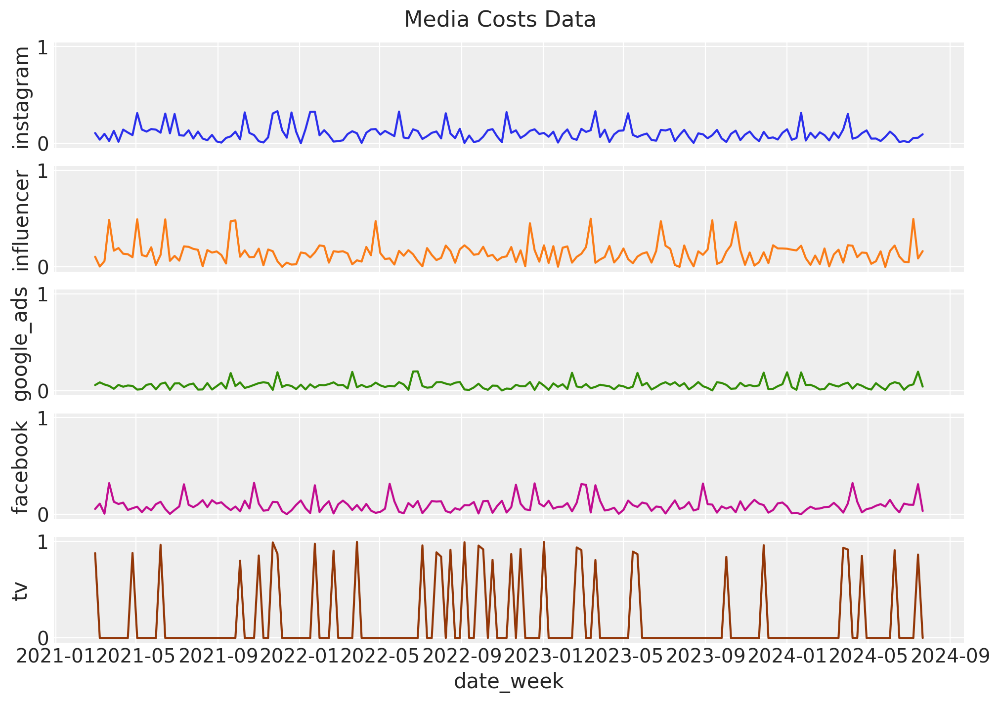

In [73]:
# media data
x1 = rng.uniform(low=0.0, high=1.0, size=n)
df["instagram"] = np.where(x1 > 0.9, x1/3, x1 / 2 / 3)

x2 = rng.uniform(low=0.0, high=1.0, size=n)
df["tv"] = np.where(x2 > 0.8, x2, 0)

x3 = rng.uniform(low=0.0, high=1.0, size=n)
df["influencer"] = np.where(x3 > 0.9, x3/2, x3 / 2 / 2)

x4 = rng.uniform(low=0.0, high=1.0, size=n)
df["google_ads"] = np.where(x4 > 0.9, x4/5, x4 / 2 / 5)

x5 = rng.uniform(low=0.0, high=1.0, size=n)
df["facebook"] = np.where(x5 > 0.9, x5/3, x5 / 2 / 3)


fig, ax = plt.subplots(
    nrows=5, ncols=1, figsize=(10, 7), sharex=True, sharey=True, layout="constrained"
)
sns.lineplot(x="date_week", y="instagram", data=df, color="C0", ax=ax[0])
sns.lineplot(x="date_week", y="influencer", data=df, color="C1", ax=ax[1])
sns.lineplot(x="date_week", y="google_ads", data=df, color="C2", ax=ax[2])
sns.lineplot(x="date_week", y="facebook", data=df, color="C3", ax=ax[3])
sns.lineplot(x="date_week", y="tv", data=df, color="C4", ax=ax[4])
ax[1].set(xlabel="date")
fig.suptitle("Media Costs Data", fontsize=16);

In [74]:
# apply geometric adstock transformation
alpha1: float = 0.3
alpha2: float = 0.2
alpha3: float = 0.4
alpha4: float = 0.1
alpha5: float = 0.1

df["instagram_adstock"] = (
    geometric_adstock(x=df["instagram"].to_numpy(), alpha=alpha1, l_max=3, normalize=True)
    .eval()
    .flatten()
)

df["tv_adstock"] = (
    geometric_adstock(x=df["tv"].to_numpy(), alpha=alpha2, l_max=2, normalize=True)
    .eval()
    .flatten()
)
df["influencer_adstock"] = (
    geometric_adstock(x=df["influencer"].to_numpy(), alpha=alpha2, l_max=4, normalize=True)
    .eval()
    .flatten()
)
df["google_ads_adstock"] = (
    geometric_adstock(x=df["google_ads"].to_numpy(), alpha=alpha2, l_max=1, normalize=True)
    .eval()
    .flatten()
)
df["facebook_adstock"] = (
    geometric_adstock(x=df["facebook"].to_numpy(), alpha=alpha2, l_max=1, normalize=True)
    .eval()
    .flatten()
)

<ipython-input-74-ced13a9d7d84>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["instagram_adstock"] = (
<ipython-input-74-ced13a9d7d84>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["tv_adstock"] = (
<ipython-input-74-ced13a9d7d84>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

In [75]:
# apply saturation transformation
lam1: float = 4.0
lam2: float = 3.0
lam3: float = 5.0
lam4: float = 2.0
lam5: float = 2.0

df["instagram_adstock_saturated"] = logistic_saturation(
    x=df["instagram_adstock"].to_numpy(), lam=lam1
).eval()

df["tv_adstock_saturated"] = logistic_saturation(
    x=df["tv_adstock"].to_numpy(), lam=lam2
).eval()

df["influencer_adstock_saturated"] = logistic_saturation(
    x=df["influencer_adstock"].to_numpy(), lam=lam2
).eval()

df["google_ads_adstock_saturated"] = logistic_saturation(
    x=df["google_ads_adstock"].to_numpy(), lam=lam2
).eval()

df["facebook_adstock_saturated"] = logistic_saturation(
    x=df["facebook_adstock"].to_numpy(), lam=lam2
).eval()

<ipython-input-75-463ead3d4676>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["instagram_adstock_saturated"] = logistic_saturation(
<ipython-input-75-463ead3d4676>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["tv_adstock_saturated"] = logistic_saturation(
<ipython-input-75-463ead3d4676>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyda

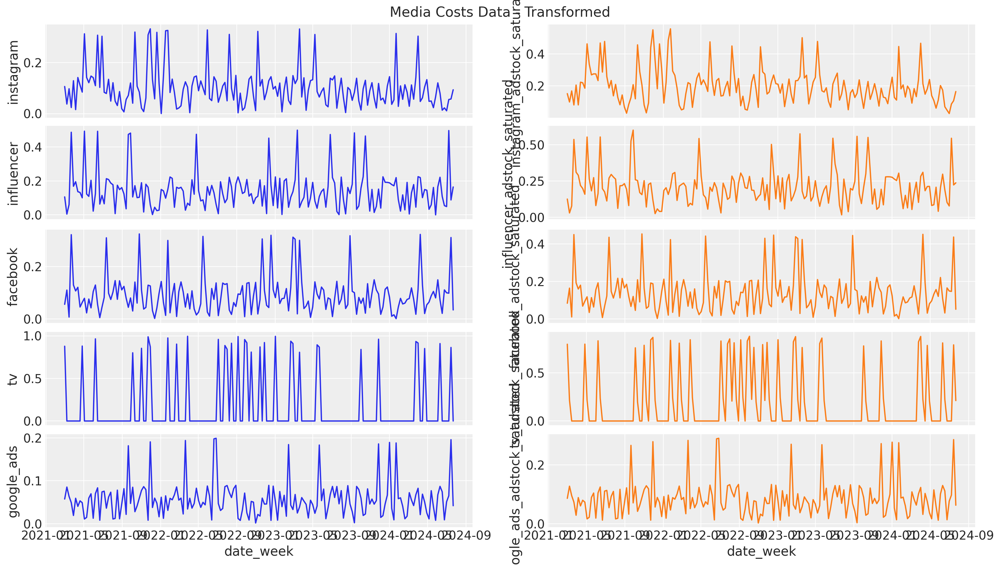

In [76]:
fig, ax = plt.subplots(
    nrows=5, ncols=2, figsize=(16, 9), sharex=True, sharey=False, layout="constrained"
)
sns.lineplot(x="date_week", y="instagram", data=df, color="C0", ax=ax[0, 0])
sns.lineplot(x="date_week", y="instagram_adstock_saturated", data=df, color="C1", ax=ax[0, 1])
sns.lineplot(x="date_week", y="influencer", data=df, color="C0", ax=ax[1, 0])
sns.lineplot(x="date_week", y="influencer_adstock_saturated", data=df, color="C1", ax=ax[1, 1])
sns.lineplot(x="date_week", y="facebook", data=df, color="C0", ax=ax[2, 0])
sns.lineplot(x="date_week", y="facebook_adstock_saturated", data=df, color="C1", ax=ax[2, 1])
sns.lineplot(x="date_week", y="tv", data=df, color="C0", ax=ax[3, 0])
sns.lineplot(x="date_week", y="tv_adstock_saturated", data=df, color="C1", ax=ax[3, 1])
sns.lineplot(x="date_week", y="google_ads", data=df, color="C0", ax=ax[4, 0])
sns.lineplot(x="date_week", y="google_ads_adstock_saturated", data=df, color="C1", ax=ax[4, 1])
fig.suptitle("Media Costs Data - Transformed", fontsize=16);

<ipython-input-77-58d4c85809e9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["trend"] = (np.linspace(start=0.0, stop=50, num=n) + 10) ** (1 / 4) - 1
<ipython-input-77-58d4c85809e9>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["cs"] = -np.sin(2 * 2 * np.pi * df["dayofyear"] / 365.5)
<ipython-input-77-58d4c85809e9>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

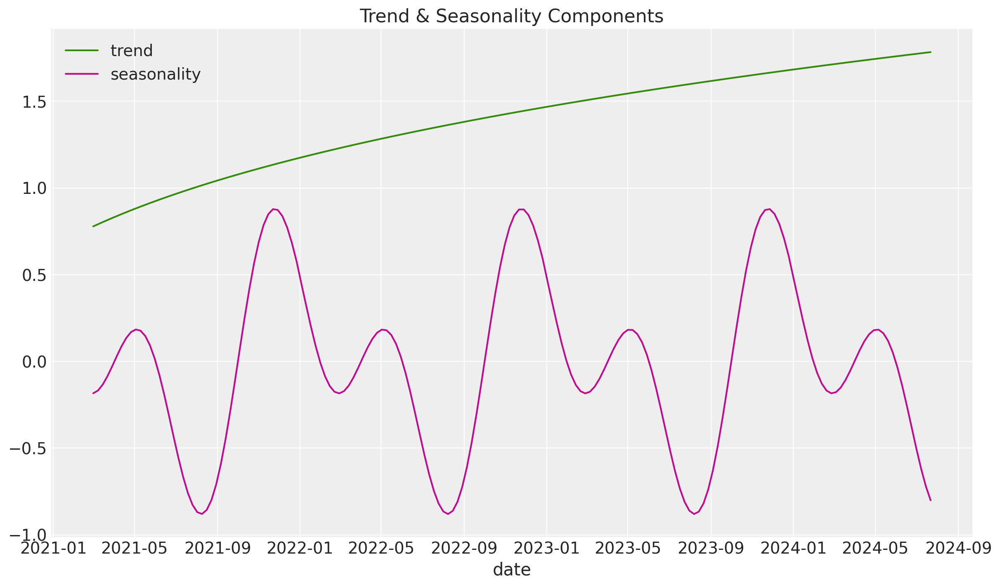

In [77]:
df["trend"] = (np.linspace(start=0.0, stop=50, num=n) + 10) ** (1 / 4) - 1

df["cs"] = -np.sin(2 * 2 * np.pi * df["dayofyear"] / 365.5)
df["cc"] = np.cos(1 * 2 * np.pi * df["dayofyear"] / 365.5)
df["seasonality"] = 0.5 * (df["cs"] + df["cc"])

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="trend", color="C2", label="trend", data=df, ax=ax)
sns.lineplot(
    x="date_week", y="seasonality", color="C3", label="seasonality", data=df, ax=ax
)
ax.legend(loc="upper left")
ax.set(title="Trend & Seasonality Components", xlabel="date", ylabel=None);

<ipython-input-78-dca3165384df>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["intercept"] = 2.0
<ipython-input-78-dca3165384df>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["epsilon"] = rng.normal(loc=0.0, scale=0.25, size=n)
<ipython-input-78-dca3165384df>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

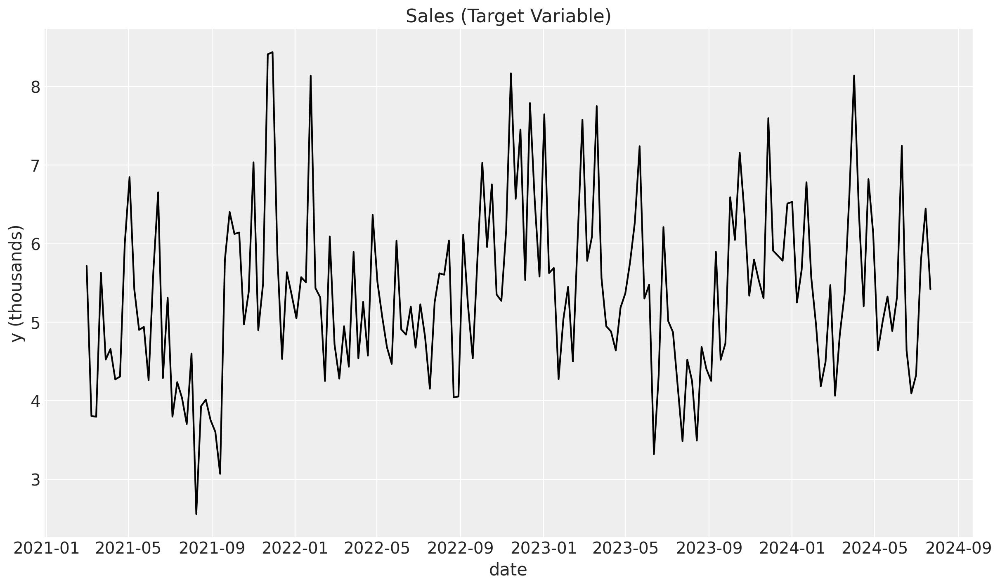

In [78]:
df["intercept"] = 2.0
df["epsilon"] = rng.normal(loc=0.0, scale=0.25, size=n)

amplitude = 1
beta_1 = 3.0
beta_2 = 2.0
beta_3 = 4.0
beta_4 = 1.0
beta_5 = 1.0
betas = [beta_1, beta_2, beta_3, beta_4, beta_5]


df["y"] = amplitude * (
    df["intercept"]
    + df["trend"]
    + df["seasonality"]
    + beta_1 * df["instagram_adstock_saturated"]
    + beta_2 * df["tv_adstock_saturated"]
    + beta_3 * df["influencer_adstock_saturated"]
    + beta_4 * df["google_ads_adstock_saturated"]
    + beta_5 * df["facebook_adstock_saturated"]
    + df["epsilon"]
)

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="y", color="black", data=df, ax=ax)
ax.set(title="Sales (Target Variable)", xlabel="date", ylabel="y (thousands)");

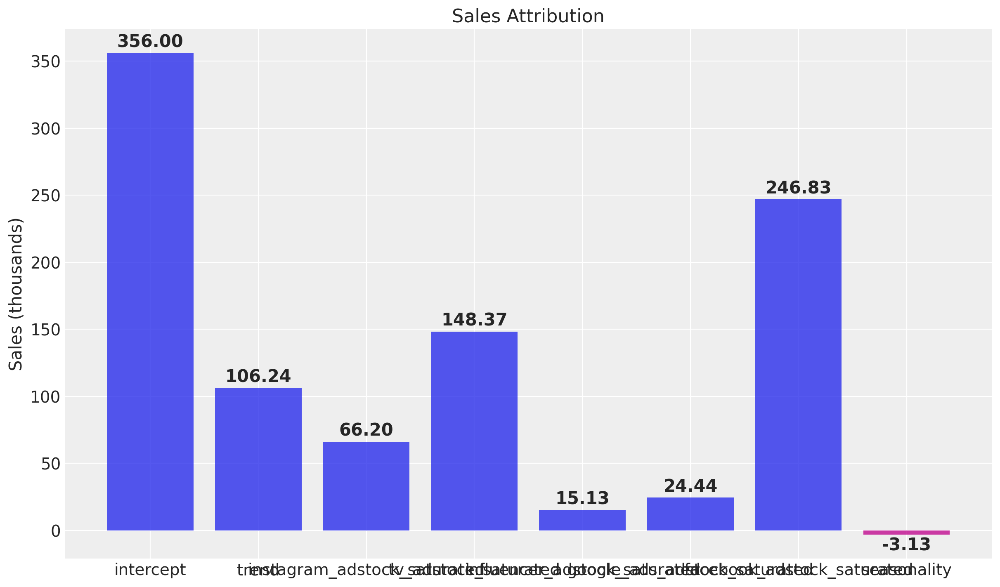

In [79]:
fig, ax = plt.subplots()

contributions = [
    df["intercept"].sum(),
    (beta_1 * df["instagram_adstock_saturated"]).sum(),
    (beta_2 * df["tv_adstock_saturated"]).sum(),
    (beta_3 * df["influencer_adstock_saturated"]).sum(),
    (beta_4 * df["google_ads_adstock_saturated"]).sum(),
    (beta_5 * df["facebook_adstock_saturated"]).sum(),
    df["trend"].sum(),
    df["seasonality"].sum(),
]

ax.bar(
    ["intercept",
     "trend",
     'instagram_adstock_saturated',
     'tv_adstock_saturated',
     'influencer_adstock_saturated',
     "google_ads_adstock_saturated",
     'facebook_adstock_saturated',
     "seasonality"],
    contributions,
    color=["C0" if x >= 0 else "C3" for x in contributions],
    alpha=0.8,
)
ax.bar_label(
    ax.containers[0],
    fmt="{:,.2f}",
    label_type="edge",
    padding=2,
    fontsize=15,
    fontweight="bold",
)
ax.set(title="Sales Attribution", ylabel="Sales (thousands)");

In [80]:
contribution_share_x1: float = (beta_1 * df["instagram_adstock_saturated"]).sum() / (
    beta_1 * df["instagram_adstock_saturated"] + beta_2 * df["tv_adstock_saturated"] + beta_3 * df["influencer_adstock_saturated"] + beta_4 * df["google_ads_adstock_saturated"]+ beta_5 * df["facebook_adstock_saturated"]
).sum()

contribution_share_x2: float = (beta_2 * df["tv_adstock_saturated"]).sum() / (
    beta_1 * df["instagram_adstock_saturated"] + beta_2 * df["tv_adstock_saturated"] + beta_3 * df["influencer_adstock_saturated"] + beta_4 * df["google_ads_adstock_saturated"]+ beta_5 * df["facebook_adstock_saturated"]
).sum()
contribution_share_x3: float = (beta_3 * df["influencer_adstock_saturated"]).sum() / (
    beta_1 * df["instagram_adstock_saturated"] + beta_2 * df["tv_adstock_saturated"] + beta_3 * df["influencer_adstock_saturated"] + beta_4 * df["google_ads_adstock_saturated"]+ beta_5 * df["facebook_adstock_saturated"]
).sum()
contribution_share_x4: float = (beta_4 * df["google_ads_adstock_saturated"]).sum() / (
    beta_1 * df["instagram_adstock_saturated"] + beta_2 * df["tv_adstock_saturated"] + beta_3 * df["influencer_adstock_saturated"] + beta_4 * df["google_ads_adstock_saturated"]+ beta_5 * df["facebook_adstock_saturated"]
).sum()
contribution_share_x5: float = (beta_5 * df["facebook_adstock_saturated"]).sum() / (
    beta_1 * df["instagram_adstock_saturated"] + beta_2 * df["tv_adstock_saturated"] + beta_3 * df["influencer_adstock_saturated"] + beta_4 * df["google_ads_adstock_saturated"]+ beta_5 * df["facebook_adstock_saturated"]
).sum()

print(f"Contribution Share of x1: {contribution_share_x1:.2f}")
print(f"Contribution Share of x2: {contribution_share_x2:.2f}")
print(f"Contribution Share of x2: {contribution_share_x3:.2f}")
print(f"Contribution Share of x2: {contribution_share_x4:.2f}")
print(f"Contribution Share of x2: {contribution_share_x5:.2f}")

Contribution Share of x1: 0.29
Contribution Share of x2: 0.18
Contribution Share of x2: 0.41
Contribution Share of x2: 0.04
Contribution Share of x2: 0.07


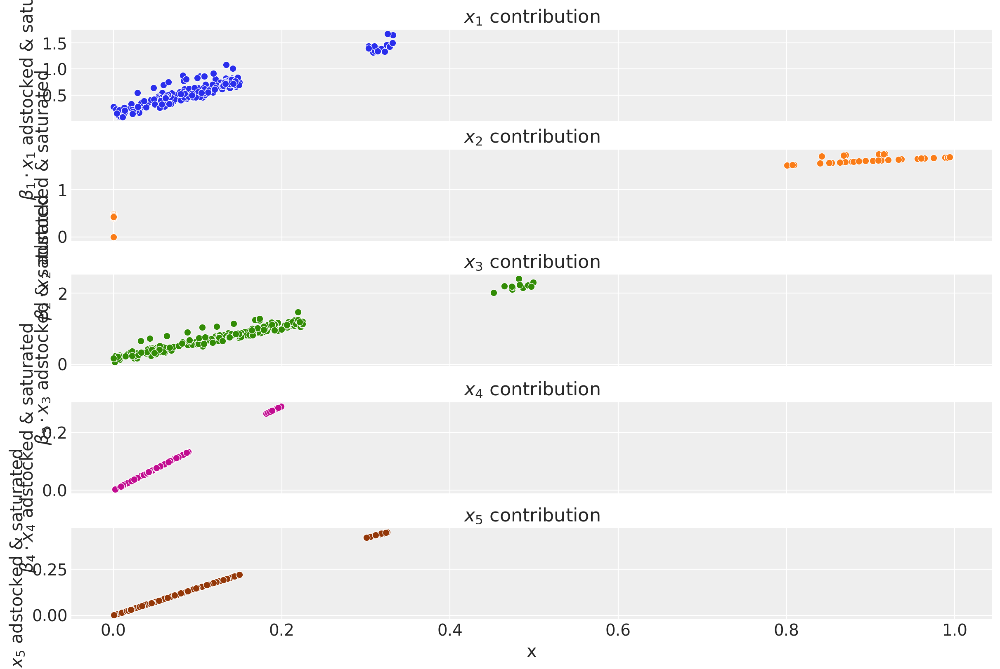

In [81]:
fig, ax = plt.subplots(
    nrows=5, ncols=1, figsize=(12, 8), sharex=True, sharey=False, layout="constrained"
)

for i, x in enumerate(["instagram", "tv", "influencer", "google_ads", "facebook"]):
    sns.scatterplot(
        x=df[x],
        y=amplitude * betas[i] * df[f"{x}_adstock_saturated"],
        color=f"C{i}",
        ax=ax[i],
    )
    ax[i].set(
        title=f"$x_{i + 1}$ contribution",
        ylabel=f"$\\beta_{i + 1} \\cdot x_{i + 1}$ adstocked & saturated",
        xlabel="x",
    )

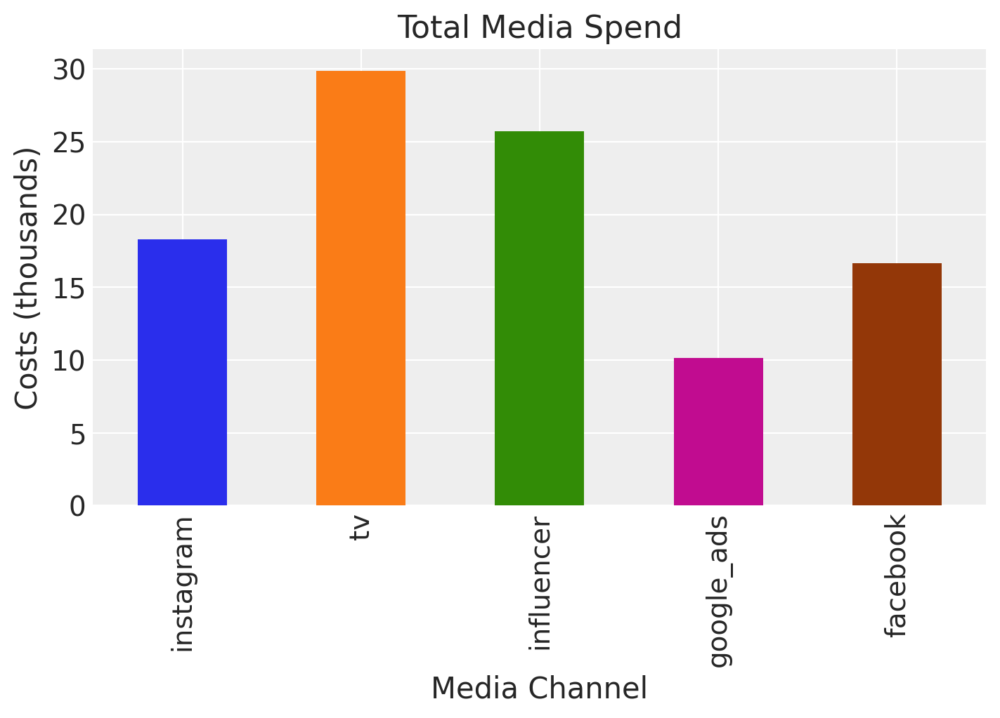

In [82]:
fig, ax = plt.subplots(figsize=(7, 5))
df[["instagram", "tv", "influencer", "google_ads", "facebook"]].sum().plot(kind="bar", color=["C0", "C1", "C2","C3","C4"], ax=ax)
ax.set(title="Total Media Spend", xlabel="Media Channel", ylabel="Costs (thousands)");



In [83]:
roas_1 = (amplitude * beta_1 * df["instagram_adstock_saturated"]).sum() / df["instagram"].sum()
roas_2 = (amplitude * beta_2 * df["tv_adstock_saturated"]).sum() / df["tv"].sum()
roas_3 = (amplitude * beta_3 * df["influencer_adstock_saturated"]).sum() / df["influencer"].sum()
roas_4 = (amplitude * beta_4 * df["google_ads_adstock_saturated"]).sum() / df["google_ads"].sum()
roas_5 = (amplitude * beta_5 * df["facebook_adstock_saturated"]).sum() / df["facebook"].sum()

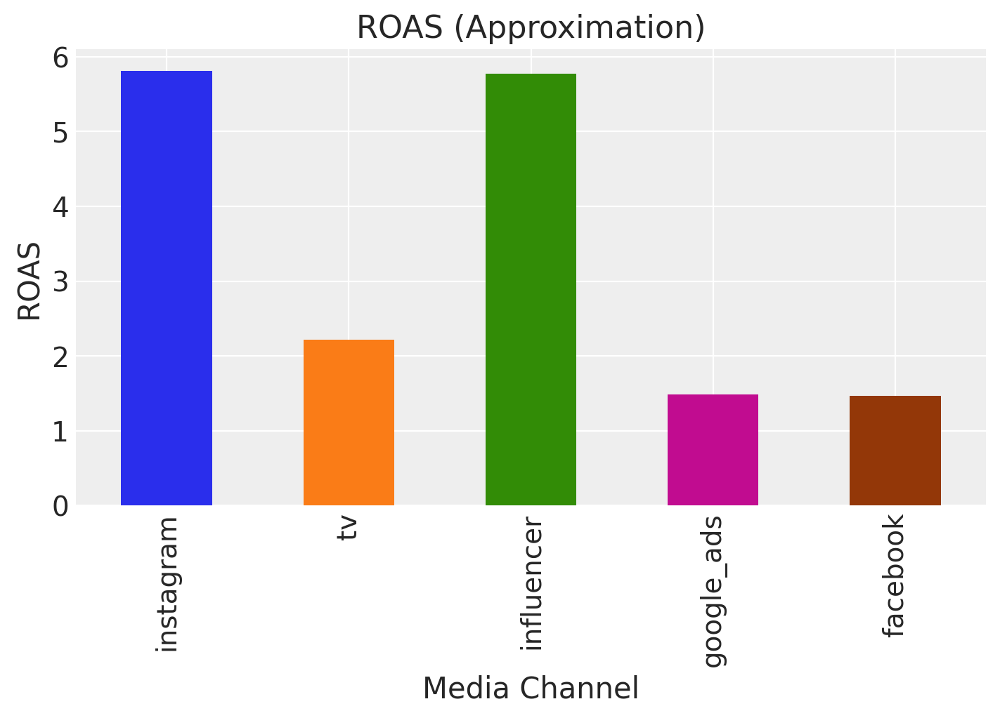

In [84]:
fig, ax = plt.subplots(figsize=(7, 5))
(
    pd.Series(data=[roas_1, roas_2, roas_3, roas_4, roas_5], index=["instagram", "tv", "influencer", "google_ads", "facebook"]).plot(
        kind="bar", color=["C0", "C1", "C2", "C3", "C4"]
    )
)

ax.set(title="ROAS (Approximation)", xlabel="Media Channel", ylabel="ROAS");

In [85]:
columns_to_keep = [
    "date_week",
    "y",
    "instagram", "tv", "influencer", "google_ads", "facebook",
    "dayofyear",
]

data = df[columns_to_keep].copy()
data["t"] = range(n)
data.head()

,date_week,y,instagram,tv,influencer,google_ads,facebook,dayofyear,t
0,2021-03-01,5.716073,0.106193,0.877714,0.105837,0.057630,0.055653,60,0
1,2021-03-08,3.805487,0.037463,0.000000,0.004394,0.085490,0.110235,67,1
2,2021-03-15,3.795397,0.097467,0.000000,0.060643,0.063653,0.006855,74,2
3,2021-03-22,5.630097,0.023800,0.000000,0.486655,0.049222,0.322597,81,3
4,2021-03-29,4.524374,0.128915,0.000000,0.168451,0.019239,0.129727,88,4


In [86]:
total_spend_per_channel = data[["instagram", "tv", "influencer", "google_ads", "facebook"]].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()

spend_share

,0
instagram,0.181722
tv,0.296476
influencer,0.255223
google_ads,0.100961
facebook,0.165617


In [87]:
n_channels = 5

prior_sigma = n_channels * spend_share.to_numpy()

prior_sigma.tolist()

[0.9086113952010265,
 1.4823806685129226,
 1.2761171002959508,
 0.5048070051723206,
 0.8280838308177796]

In [88]:
X = data.drop("y", axis=1)
y = data["y"]

In [89]:
my_model_config = {
    "intercept": {"dist": "Normal", "kwargs": {"mu": 0, "sigma": 0.5}},
    "saturation_beta": {
        "dist": "HalfNormal",
        "kwargs": {"sigma": prior_sigma},
    },
    "gamma_control": {
        "dist": "Normal",
        "kwargs": {"mu": 0, "sigma": 0.05},
    },
    "gamma_fourier": {
        "dist": "Laplace",
        "kwargs": {"mu": 0, "b": 0.2},
    },
    "likelihood": {
        "dist": "Normal",
        "kwargs": {
            "sigma": {"dist": "Exponential", "kwargs": {"lam": 1 / 10}}
            # Also possible define sigma as:
            # {'sigma': 5}
        },
    },
}

In [90]:
my_sampler_config = {"progressbar": True}

In [91]:
from pymc_marketing.mmm import (
    GeometricAdstock,
    LogisticSaturation,
    MMM,
)


In [92]:
mmm = MMM(
    model_config=my_model_config,
    sampler_config=my_sampler_config,
    date_column="date_week",
    adstock=GeometricAdstock(l_max=2),
    saturation=LogisticSaturation(),
    channel_columns=["instagram", "tv", "influencer", "google_ads", "facebook"],
    control_columns=["t"],
    yearly_seasonality=2,
)

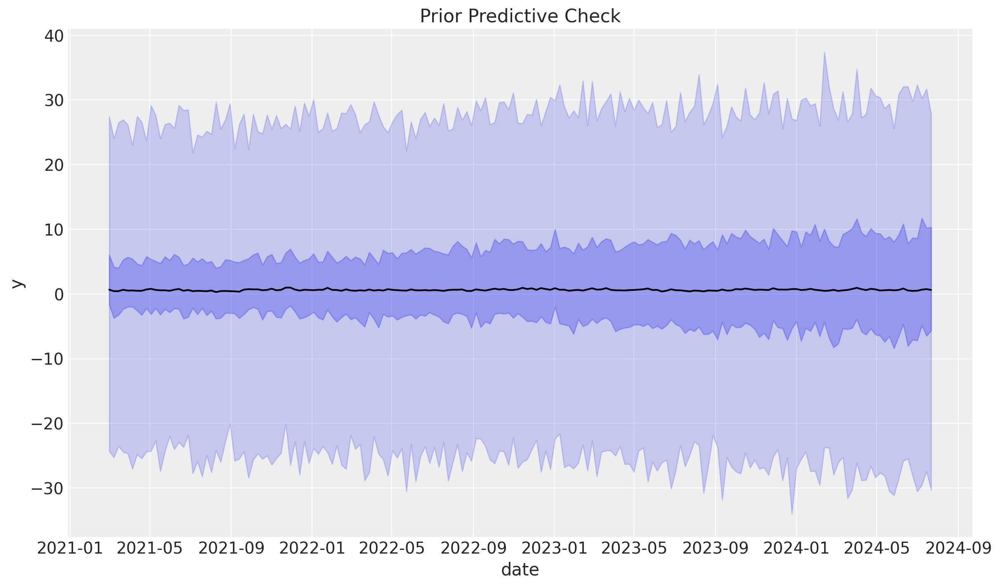

In [93]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X, y, samples=2_000)

mmm.plot_prior_predictive();

In [94]:
pip install numpyro

In [95]:
mmm.fit(X=X, y=y, target_accept=0.85, chains=4, nuts_sampler="numpyro", random_seed=rng)

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:01<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

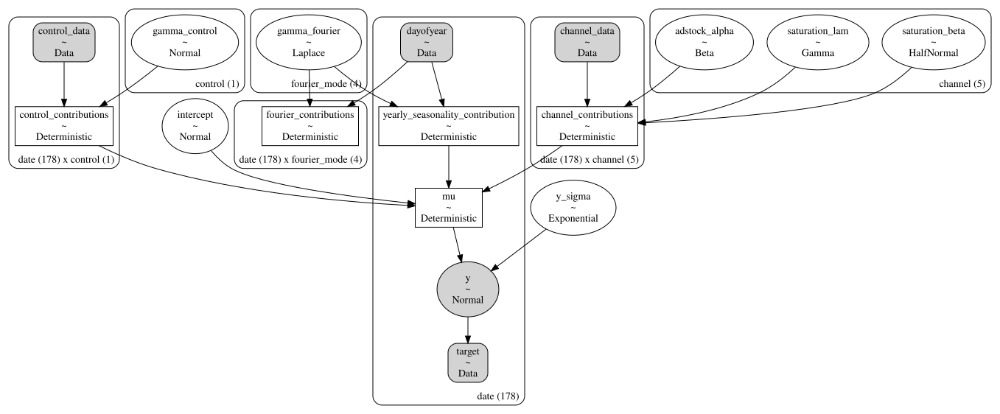

In [96]:
pm.model_to_graphviz(model=mmm.model)

In [97]:
# Number of diverging samples
mmm.idata["sample_stats"]["diverging"].sum().item()

0

In [98]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,0.364,0.012,0.342,0.386,0.000,0.000,2779.0,2818.0,1.0
y_sigma,0.032,0.002,0.029,0.036,0.000,0.000,3514.0,2570.0,1.0
saturation_beta[instagram],0.456,0.246,0.189,0.891,0.006,0.004,1965.0,2049.0,1.0
saturation_beta[tv],0.491,0.291,0.194,1.013,0.008,0.006,1368.0,1955.0,1.0
saturation_beta[influencer],0.530,0.242,0.275,0.945,0.008,0.005,1673.0,1129.0,1.0
saturation_beta[google_ads],0.078,0.077,0.002,0.195,0.002,0.001,1907.0,1820.0,1.0
saturation_beta[facebook],0.094,0.094,0.015,0.210,0.003,0.002,1879.0,1384.0,1.0
saturation_lam[instagram],1.138,0.498,0.330,2.075,0.010,0.007,2049.0,2087.0,1.0
saturation_lam[tv],1.525,0.806,0.262,2.889,0.021,0.015,1377.0,1975.0,1.0
saturation_lam[influencer],1.352,0.469,0.434,2.155,0.011,0.008,1673.0,1116.0,1.0


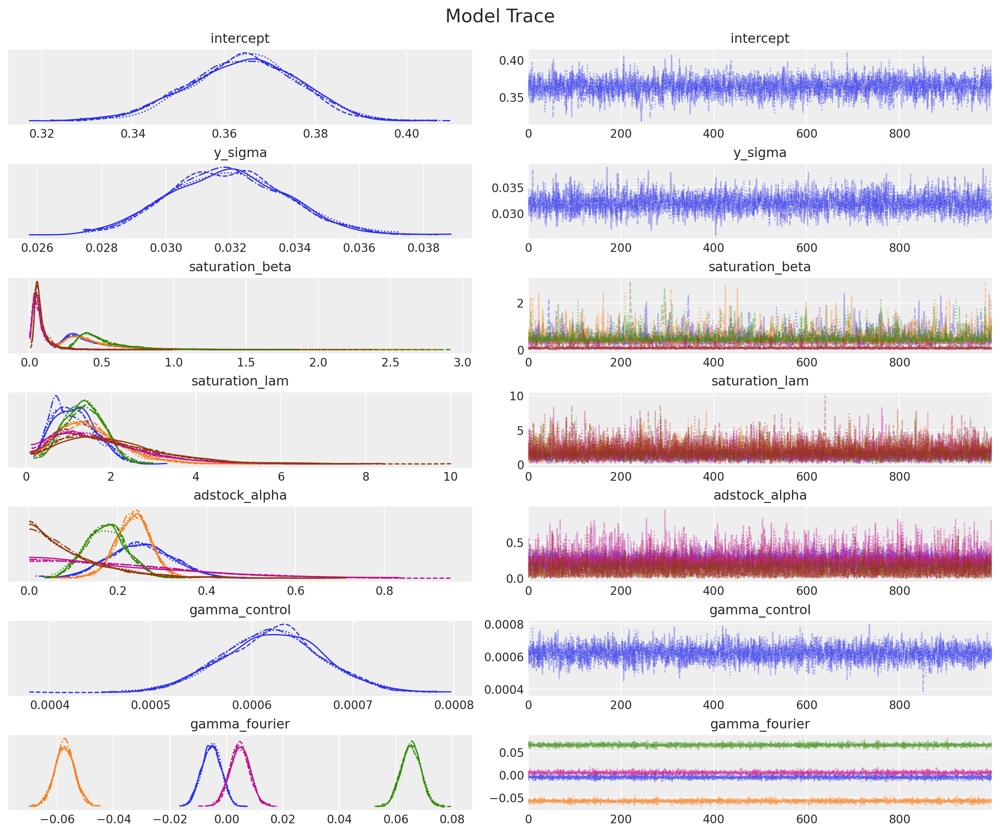

In [99]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

In [100]:
mmm.sample_posterior_predictive(X, extend_idata=True, combined=True)

Output()

<xarray.Dataset> Size: 6MB
Dimensions:  (sample: 4000, date: 178)
Coordinates:
  * date     (date) datetime64[ns] 1kB 2021-03-01 2021-03-08 ... 2024-07-22
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 6MB 5.364 6.163 5.471 ... 5.528 4.993 5.012
Attributes:
    created_at:                 2024-10-03T17:55:30.151582+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

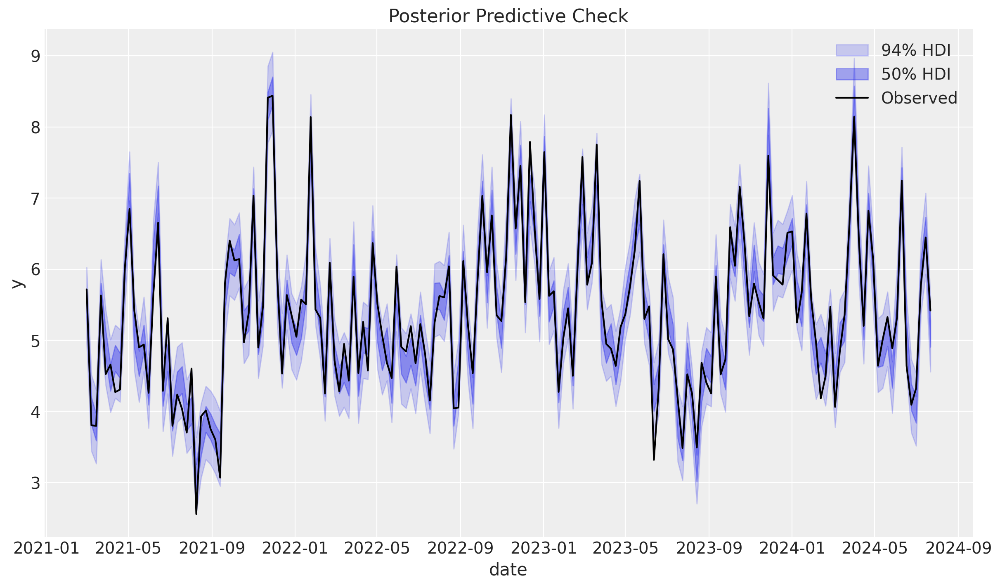

In [101]:
mmm.plot_posterior_predictive(original_scale=True);

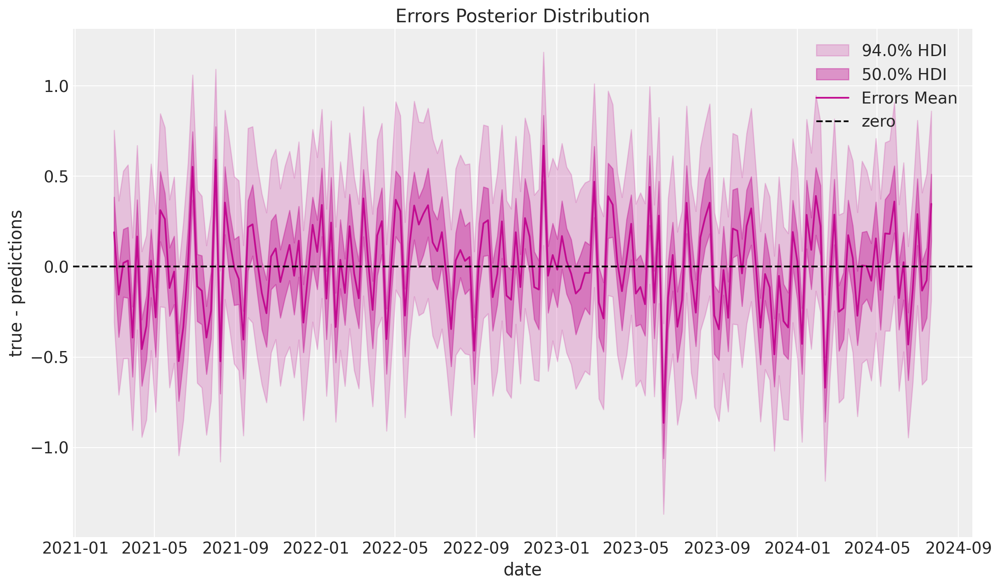

In [102]:
mmm.plot_errors(original_scale=True);

In [103]:
errors = mmm.get_errors(original_scale=True)

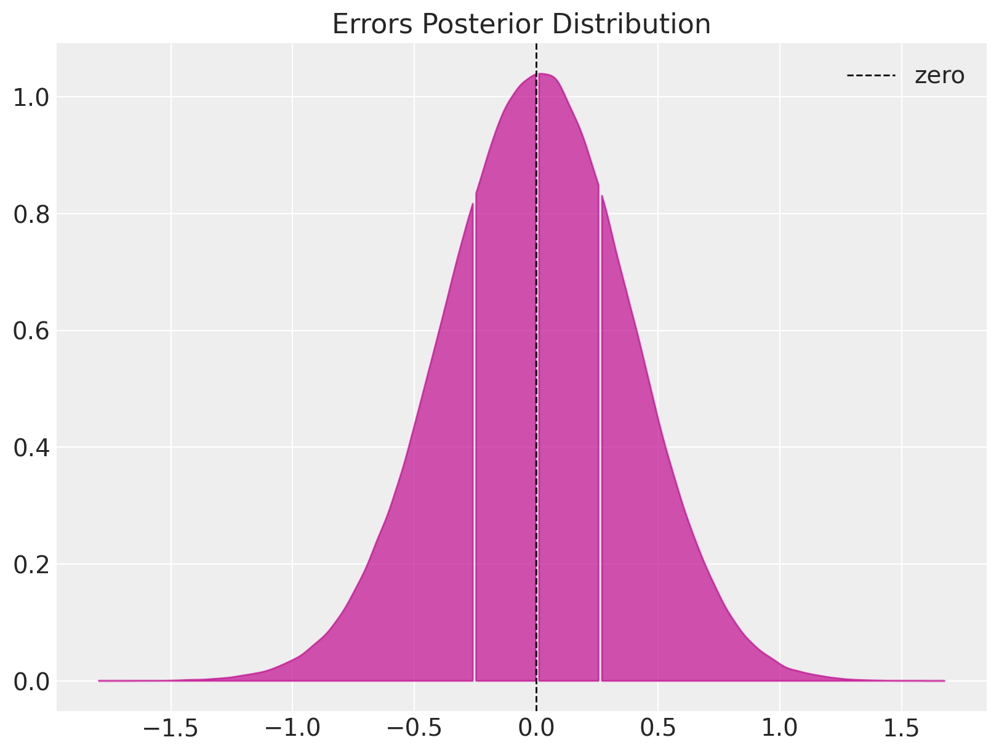

In [104]:
fig, ax = plt.subplots(figsize=(8, 6))
az.plot_dist(
    errors, quantiles=[0.25, 0.5, 0.75], color="C3", fill_kwargs={"alpha": 0.7}, ax=ax
)
ax.axvline(x=0, color="black", linestyle="--", linewidth=1, label="zero")
ax.legend()
ax.set(title="Errors Posterior Distribution");

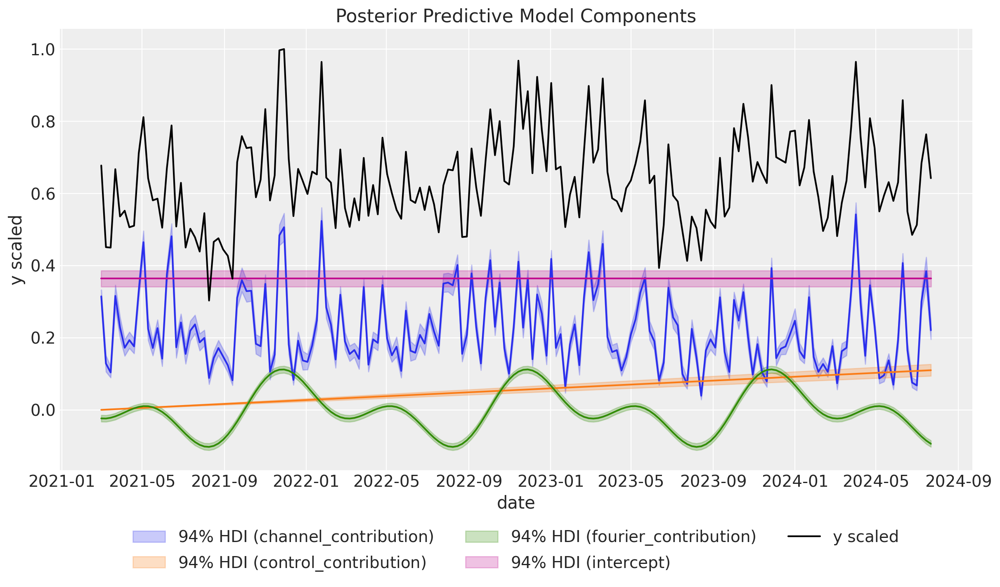

In [105]:
mmm.plot_components_contributions();

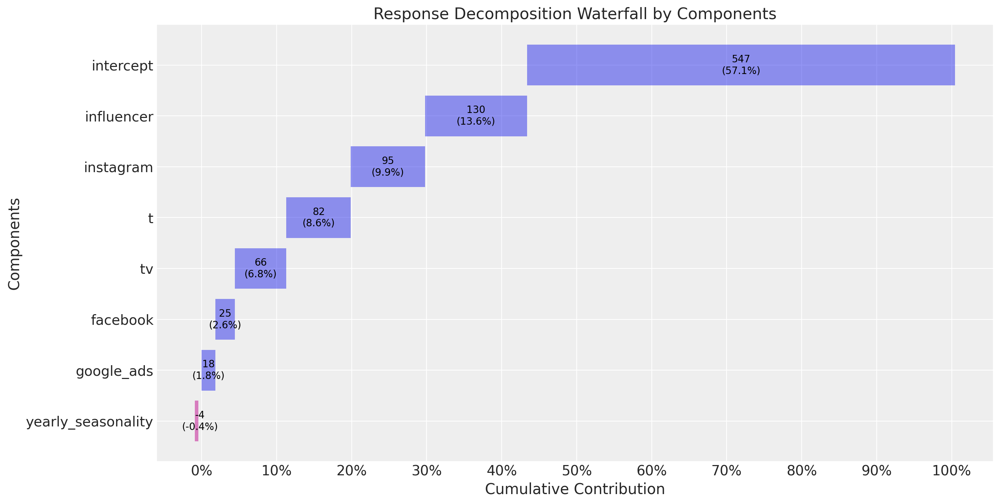

In [106]:
mmm.plot_waterfall_components_decomposition();

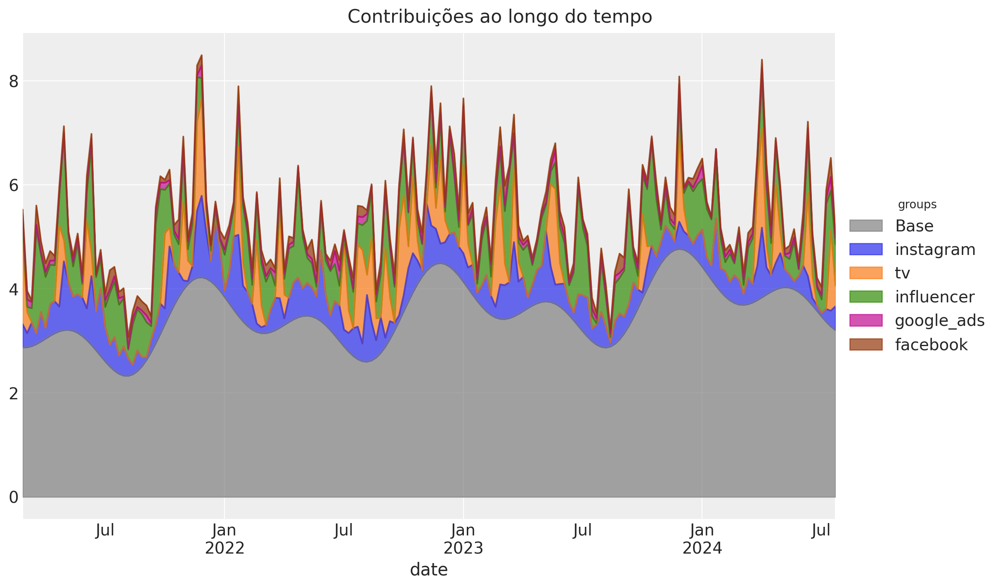

In [108]:
groups = {
    "Base": [
        "intercept",
        "t",
        "yearly_seasonality",
    ],
    "instagram": ["instagram"],
    "tv": ["tv"],
    "influencer": ["influencer"],
    "google_ads": ["google_ads"],
    "facebook": ["facebook"]
}

fig = mmm.plot_grouped_contribution_breakdown_over_time(
    stack_groups=groups,
    original_scale=True,
    area_kwargs={
        "color": {
            "instagram": "C0",
            "tv": "C1",
            "influencer": "C2",
            "google_ads": "C3",
            "facebook": "C4",
            "Base": "gray",
            "Seasonality": "black",
        },
        "alpha": 0.7,
    },
)

fig.suptitle("Contribuições ao longo do tempo", fontsize=16);

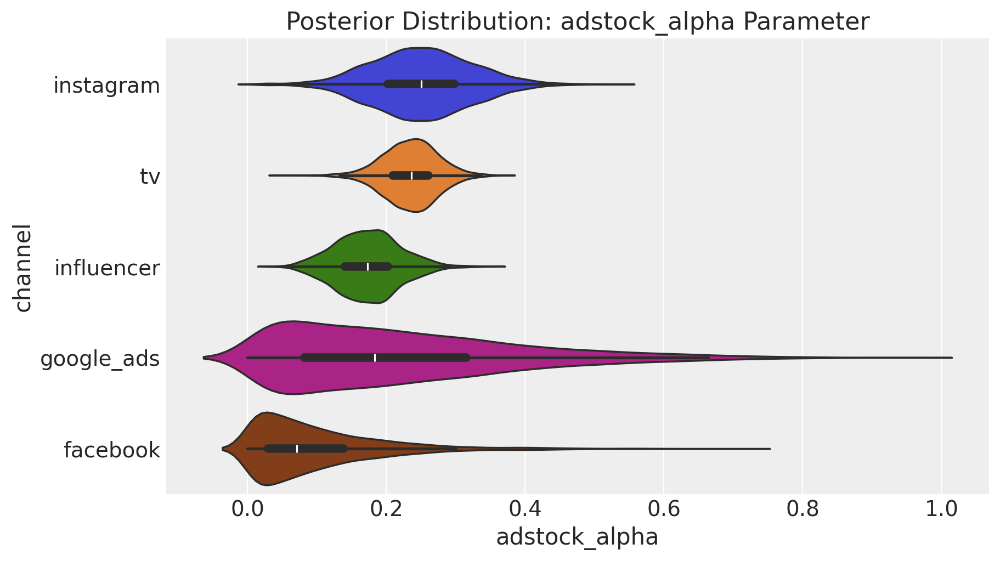

In [109]:
fig = mmm.plot_channel_parameter(param_name="adstock_alpha", figsize=(9, 5))
ax = fig.axes[0]
# ax.axvline(x=alpha1, color="C0", linestyle="--", label=r"$\alpha_1$")
# ax.axvline(x=alpha2, color="C1", linestyle="--", label=r"$\alpha_2$")
# ax.axvline(x=alpha3, color="C2", linestyle="--", label=r"$\alpha_3$")
# ax.axvline(x=alpha4, color="C3", linestyle="--", label=r"$\alpha_4$")
# ax.axvline(x=alpha5, color="C4", linestyle="--", label=r"$\alpha_5$")
ax.legend(loc="upper right")

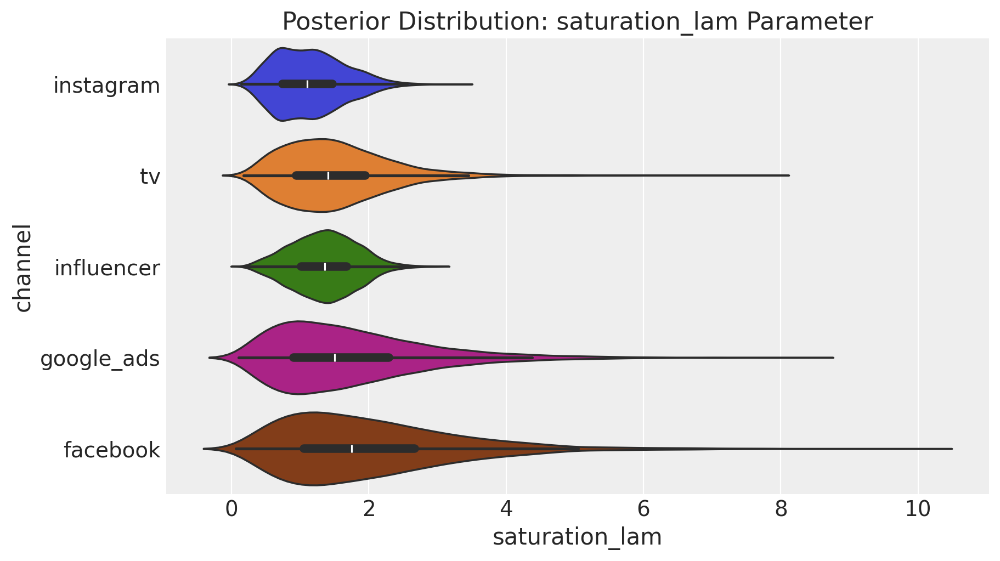

In [110]:
fig = mmm.plot_channel_parameter(param_name="saturation_lam", figsize=(9, 5))
ax = fig.axes[0]
# ax.axvline(x=lam1, color="C0", linestyle="--", label=r"$\lambda_1$")
# ax.axvline(x=lam2, color="C1", linestyle="--", label=r"$\lambda_2$")
# ax.axvline(x=lam2, color="C2", linestyle="--", label=r"$\lambda_3$")
# ax.axvline(x=lam2, color="C3", linestyle="--", label=r"$\lambda_4$")
# ax.axvline(x=lam2, color="C4", linestyle="--", label=r"$\lambda_5$")
ax.legend(loc="upper right")

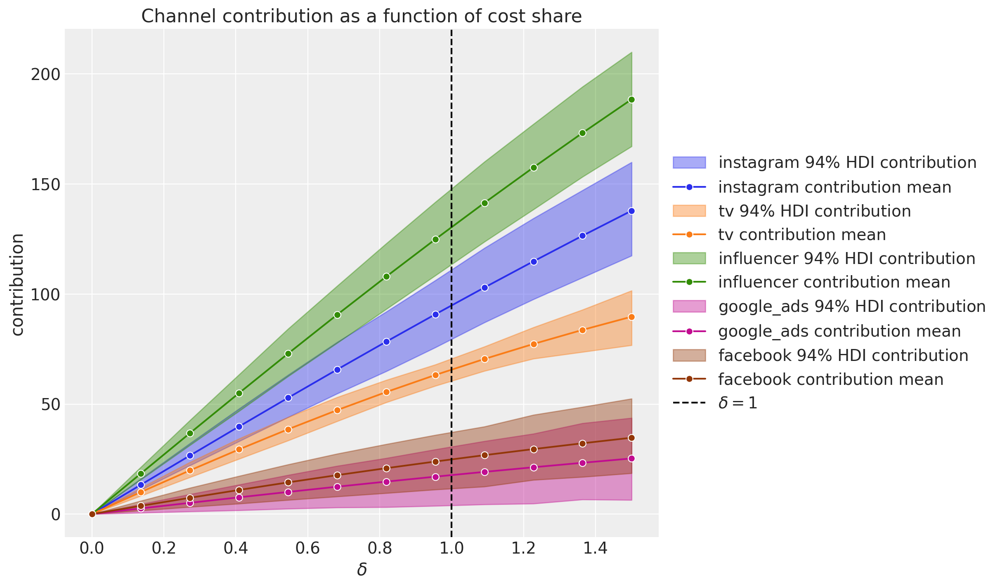

In [111]:
mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12);

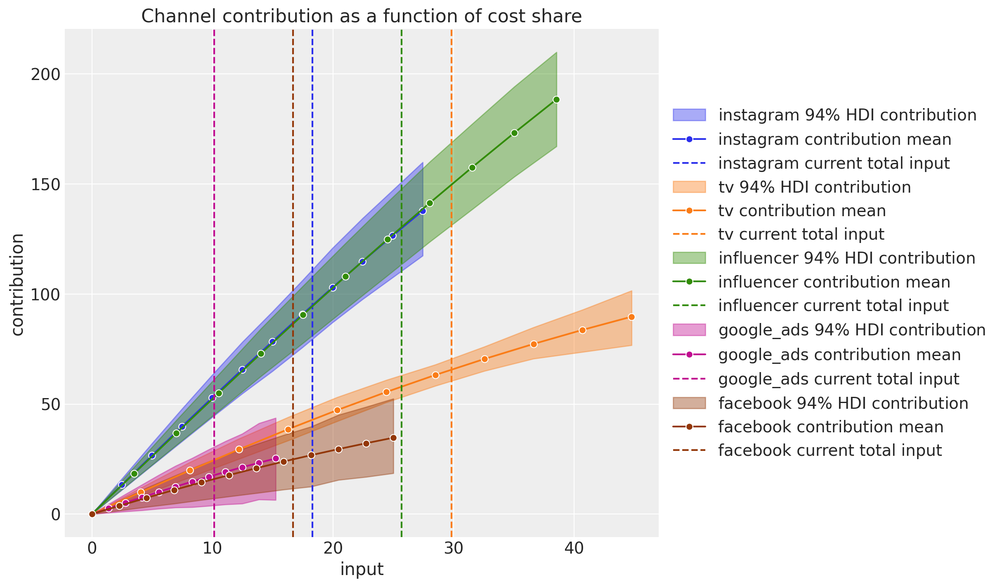

In [112]:
mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12, absolute_xrange=True);

[Text(0.5, 1.0, 'Posterior ROAS distribution'), Text(0.5, 0, 'ROAS')]

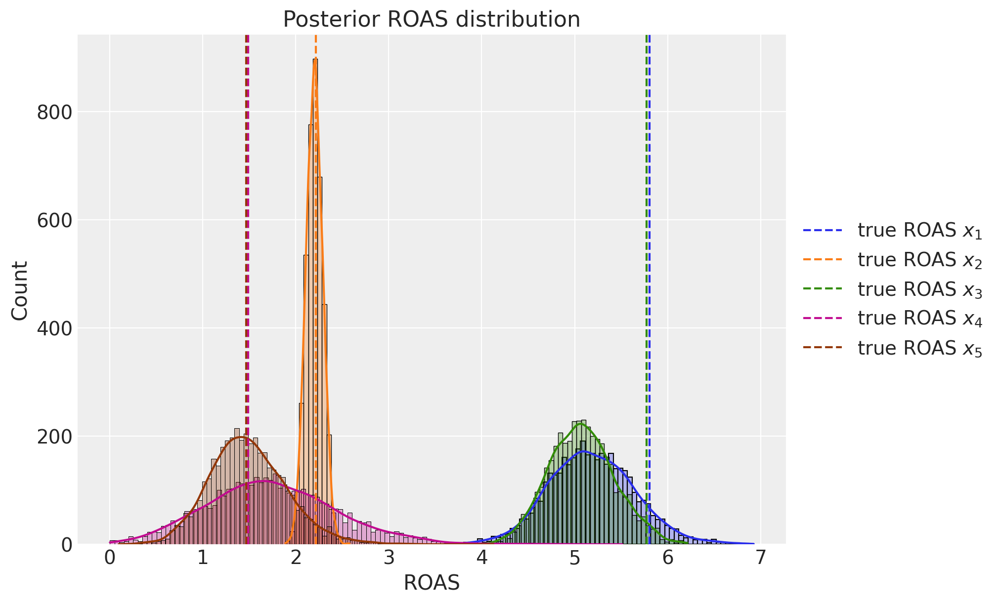

In [113]:
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

roas_samples = (
    channel_contribution_original_scale.stack(sample=("chain", "draw")).sum("date")
    / data[["instagram", "tv", "influencer", "google_ads", "facebook"]].sum().to_numpy()[..., None]
)

fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(
    roas_samples.sel(channel="instagram").to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax
)
sns.histplot(
    roas_samples.sel(channel="tv").to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax
)
sns.histplot(
    roas_samples.sel(channel="influencer").to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax
)
sns.histplot(
    roas_samples.sel(channel="google_ads").to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax
)
sns.histplot(
    roas_samples.sel(channel="facebook").to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax
)
ax.axvline(x=roas_1, color="C0", linestyle="--", label=r"true ROAS $x_{1}$")
ax.axvline(x=roas_2, color="C1", linestyle="--", label=r"true ROAS $x_{2}$")
ax.axvline(x=roas_3, color="C2", linestyle="--", label=r"true ROAS $x_{3}$")
ax.axvline(x=roas_4, color="C3", linestyle="--", label=r"true ROAS $x_{4}$")
ax.axvline(x=roas_5, color="C4", linestyle="--", label=r"true ROAS $x_{5}$")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Posterior ROAS distribution", xlabel="ROAS")

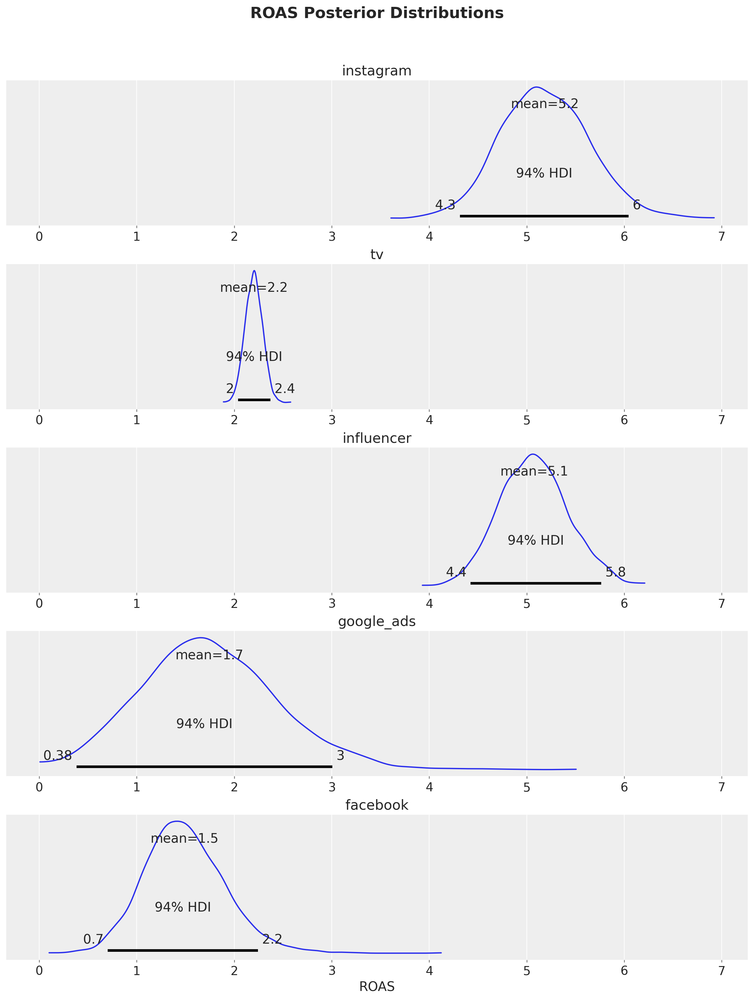

In [114]:
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
spend_sum = X[['instagram', 'tv', 'influencer', 'google_ads', 'facebook']].sum().to_numpy()

roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum[np.newaxis, np.newaxis, :]
)

fig, axes = plt.subplots(
    nrows=5, ncols=1, figsize=(12, 15), sharex=True, sharey=False, layout="constrained"
)
#az.plot_posterior(roas_samples, ref_val=[roas_1, roas_2, roas_3, roas_4, roas_5], ax=axes)
az.plot_posterior(roas_samples, ax=axes)
axes[0].set(title="instagram")
axes[1].set(title="tv")
axes[2].set(title="influencer")
axes[3].set(title="google_ads")
axes[4].set(title="facebook", xlabel="ROAS")
fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.06);

In [115]:
last_date = X["date_week"].max()

# New dates starting from last in dataset
n_new = 5
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

X_out_of_sample = pd.DataFrame(
    {
        "date_week": new_dates,
    }
)

# Same channel spends as last day
X_out_of_sample["instagram"] = X["instagram"].iloc[-1]
X_out_of_sample["tv"] = X["tv"].iloc[-1]
X_out_of_sample["influencer"] = X["influencer"].iloc[-1]
X_out_of_sample["google_ads"] = X["google_ads"].iloc[-1]
X_out_of_sample["facebook"] = X["facebook"].iloc[-1]


X_out_of_sample["t"] = range(len(X), len(X) + n_new)

X_out_of_sample


,date_week,instagram,tv,influencer,google_ads,facebook,t
0,2024-07-29,0.093419,0.0,0.164285,0.041999,0.034167,178
1,2024-08-05,0.093419,0.0,0.164285,0.041999,0.034167,179
2,2024-08-12,0.093419,0.0,0.164285,0.041999,0.034167,180
3,2024-08-19,0.093419,0.0,0.164285,0.041999,0.034167,181
4,2024-08-26,0.093419,0.0,0.164285,0.041999,0.034167,182


In [116]:
y_out_of_sample = mmm.sample_posterior_predictive(
    X_pred=X_out_of_sample, extend_idata=False
)

y_out_of_sample

Output()

<xarray.Dataset> Size: 256kB
Dimensions:  (sample: 4000, date: 5)
Coordinates:
  * date     (date) datetime64[ns] 40B 2024-07-29 2024-08-05 ... 2024-08-26
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 160kB 4.454 4.068 3.975 ... 4.704 4.895 4.81
Attributes:
    created_at:                 2024-10-03T17:56:49.402732+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

In [117]:
# media data
# x1 = rng.uniform(low=0.0, high=1.0, size=n)
# X_out_of_sample["instagram"] = np.where(x1 > 0.9, x1/3, x1 / 2 / 3)

# x2 = rng.uniform(low=0.0, high=1.0, size=n)
# X_out_of_sample["tv"] = np.where(x2 > 0.8, x2, 0)

# x3 = rng.uniform(low=0.0, high=1.0, size=n)
# X_out_of_sample["influencer"] = np.where(x3 > 0.9, x3/2, x3 / 2 / 2)

# x4 = rng.uniform(low=0.0, high=1.0, size=n)
# X_out_of_sample["google_ads"] = np.where(x4 > 0.9, x4/5, x4 / 2 / 5)

# x5 = rng.uniform(low=0.0, high=1.0, size=n)
# X_out_of_sample["facebook"] = np.where(x5 > 0.9, x5/3, x5 / 2 / 3)

In [118]:
y_out_of_sample = mmm.sample_posterior_predictive(
    X_pred=X_out_of_sample, extend_idata=False
)

y_out_of_sample

Output()

<xarray.Dataset> Size: 256kB
Dimensions:  (sample: 4000, date: 5)
Coordinates:
  * date     (date) datetime64[ns] 40B 2024-07-29 2024-08-05 ... 2024-08-26
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 160kB 4.478 4.534 4.651 ... 4.678 4.351
Attributes:
    created_at:                 2024-10-03T17:56:52.458586+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

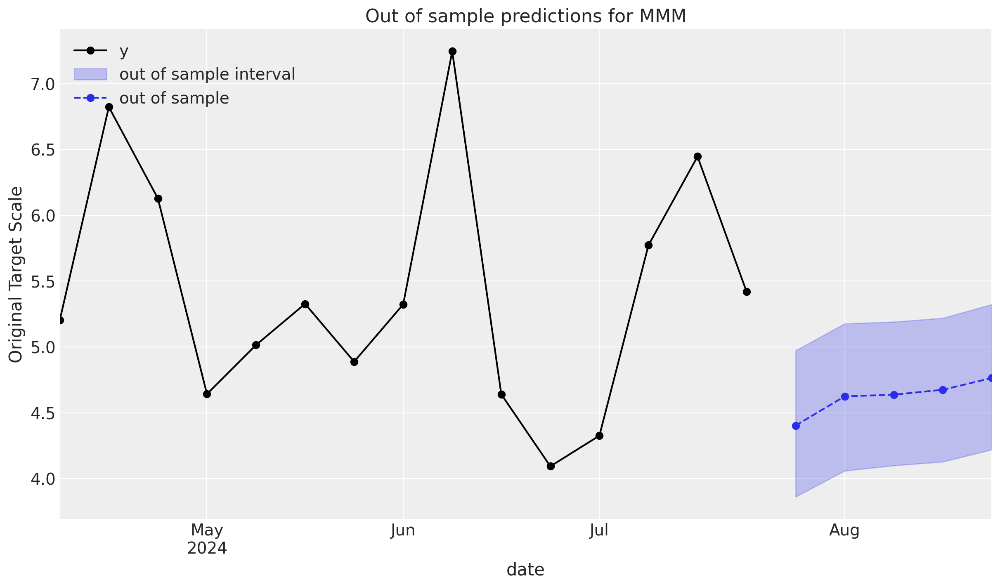

In [119]:
def plot_in_sample(X, y, ax, n_points: int = 15):
    (
        y.to_frame()
        .set_index(X["date_week"])
        .iloc[-n_points:]
        .plot(ax=ax, marker="o", color="black", label="actuals")
    )
    return ax


def plot_out_of_sample(X_out_of_sample, y_out_of_sample, ax, color, label):
    y_out_of_sample_groupby = y_out_of_sample["y"].to_series().groupby("date")

    lower, upper = quantiles = [0.025, 0.975]
    conf = y_out_of_sample_groupby.quantile(quantiles).unstack()
    ax.fill_between(
        X_out_of_sample["date_week"].dt.to_pydatetime(),
        conf[lower],
        conf[upper],
        alpha=0.25,
        color=color,
        label=f"{label} interval",
    )

    mean = y_out_of_sample_groupby.mean()
    mean.plot(ax=ax, marker="o", label=label, color=color, linestyle="--")
    ax.set(ylabel="Original Target Scale", title="Out of sample predictions for MMM")
    return ax


_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
ax.legend(loc="upper left");

In [120]:
y_out_of_sample_with_adstock = mmm.sample_posterior_predictive(
    X_pred=X_out_of_sample, extend_idata=False, include_last_observations=True
)

Output()

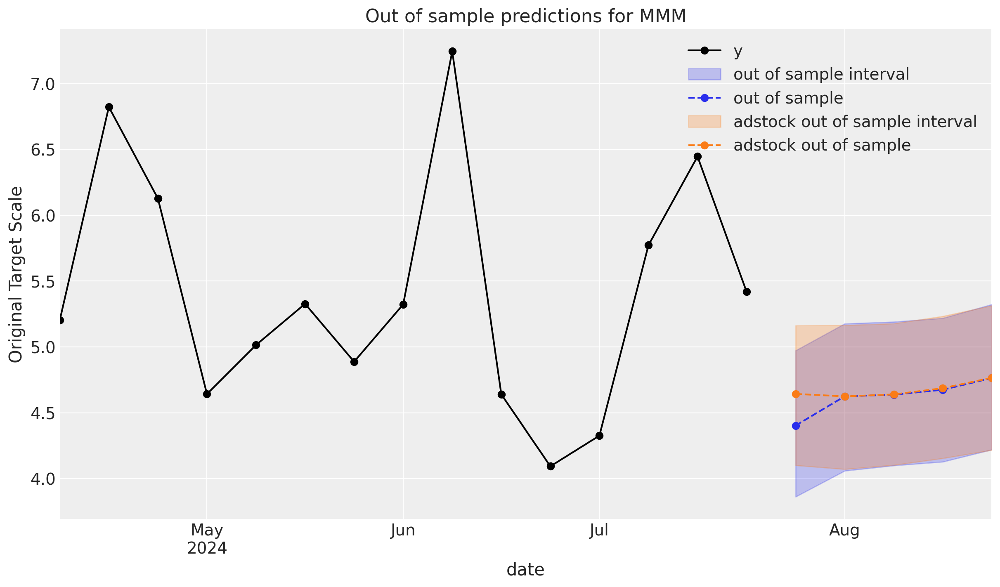

In [121]:
_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
plot_out_of_sample(
    X_out_of_sample,
    y_out_of_sample_with_adstock,
    ax=ax,
    label="adstock out of sample",
    color="C1",
)
ax.legend();

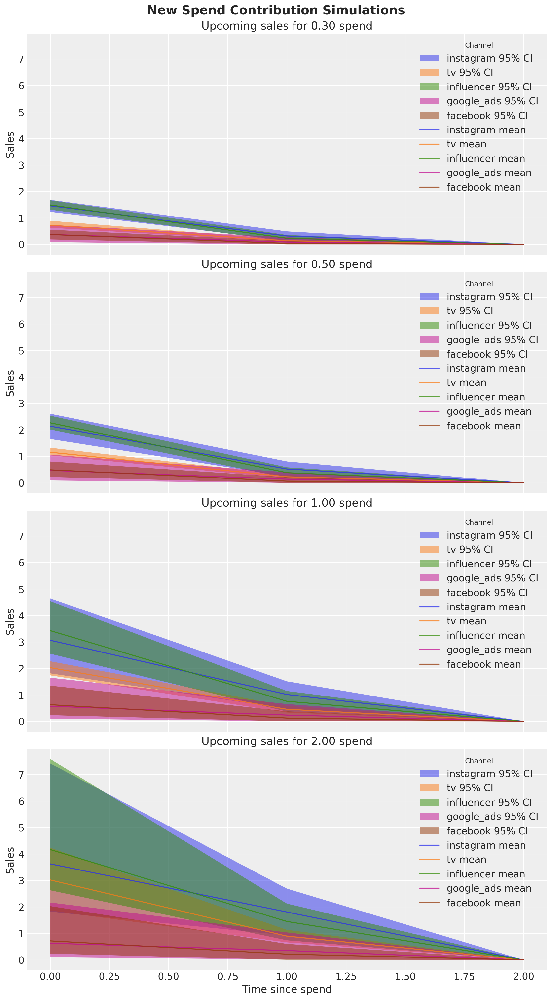

In [122]:
spends = [0.3, 0.5, 1, 2]

fig, axes = plt.subplots(
    nrows=len(spends),
    ncols=1,
    figsize=(11, 20),
    sharex=True,
    sharey=True,
    layout="constrained",
)

axes = axes.flatten()

for ax, spend in zip(axes, spends, strict=True):
    mmm.plot_new_spend_contributions(spend_amount=spend, progressbar=False, ax=ax)

fig.suptitle("New Spend Contribution Simulations", fontsize=18, fontweight="bold");

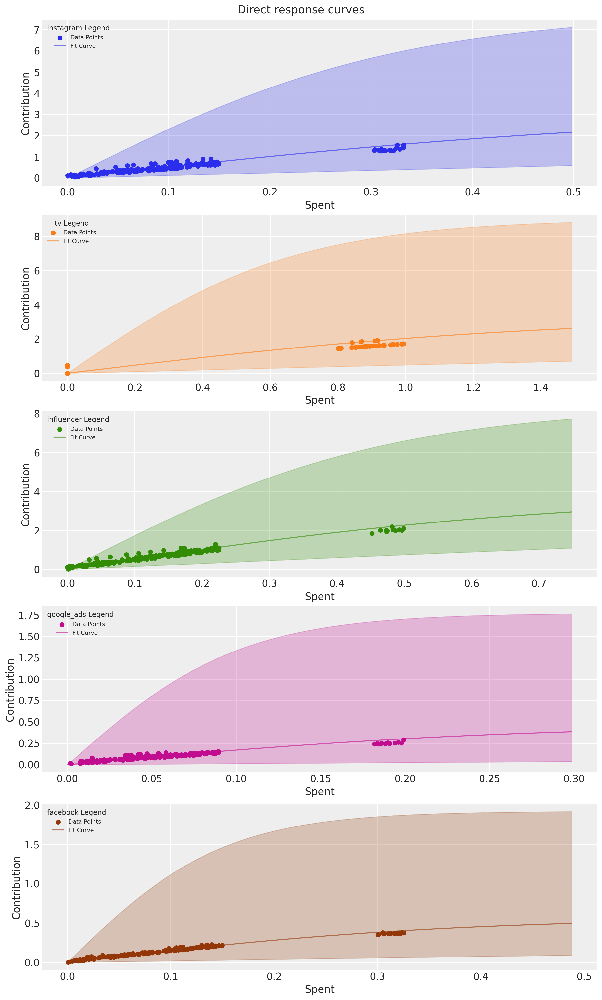

In [123]:
mmm.plot_direct_contribution_curves(show_fit=True, xlim_max=1.5);




In [124]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
saturation_beta[instagram],0.456,0.246,0.189,0.891,0.006,0.004,1965.0,2049.0,1.0
saturation_beta[tv],0.491,0.291,0.194,1.013,0.008,0.006,1368.0,1955.0,1.0
saturation_beta[influencer],0.530,0.242,0.275,0.945,0.008,0.005,1673.0,1129.0,1.0
saturation_beta[google_ads],0.078,0.077,0.002,0.195,0.002,0.001,1907.0,1820.0,1.0
saturation_beta[facebook],0.094,0.094,0.015,0.210,0.003,0.002,1879.0,1384.0,1.0
saturation_lam[instagram],1.138,0.498,0.330,2.075,0.010,0.007,2049.0,2087.0,1.0
saturation_lam[tv],1.525,0.806,0.262,2.889,0.021,0.015,1377.0,1975.0,1.0
saturation_lam[influencer],1.352,0.469,0.434,2.155,0.011,0.008,1673.0,1116.0,1.0
saturation_lam[google_ads],1.731,1.127,0.120,3.724,0.020,0.014,2440.0,2108.0,1.0
saturation_lam[facebook],1.994,1.250,0.138,4.205,0.024,0.017,1940.0,1467.0,1.0


In [125]:
total_budget = 1  # K or M
# Define your channels
channels = ['date_week', 'instagram', 'tv', 'influencer', 'google_ads', 'facebook']
# The initial split per channel
budget_per_channel = total_budget / len(channels)
# Initial budget per channel as dictionary.
initial_budget_dict = {channel: budget_per_channel for channel in channels}
# bounds for each channel
min_budget, max_budget = 0.1, 1
budget_bounds = {channel: [min_budget, max_budget] for channel in channels}

In [126]:
response = mmm.allocate_budget_to_maximize_response(
    budget=total_budget,
    num_periods=8,
    time_granularity="weekly",
    budget_bounds=budget_bounds,
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2187: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


In [127]:
print(mmm.optimal_allocation_dict)

{'instagram': 0.32047723407366824, 'tv': 0.1, 'influencer': 0.37952276592633477, 'google_ads': 0.1, 'facebook': 0.1000000000000003}


/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808bd995db0> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808be5c8220> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)


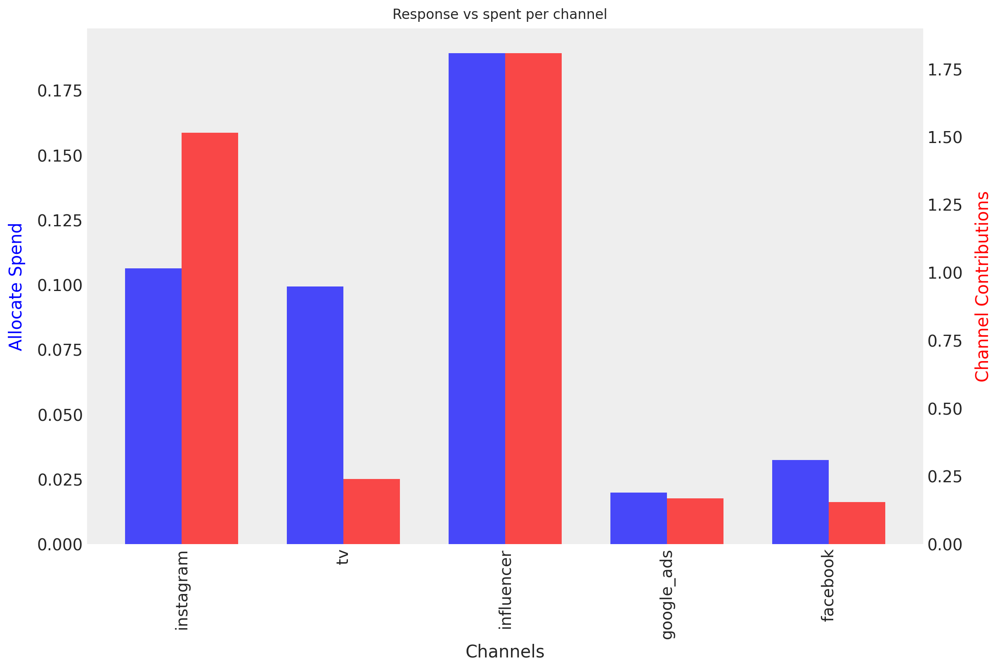

In [128]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
fig.suptitle("Response vs spent per channel");

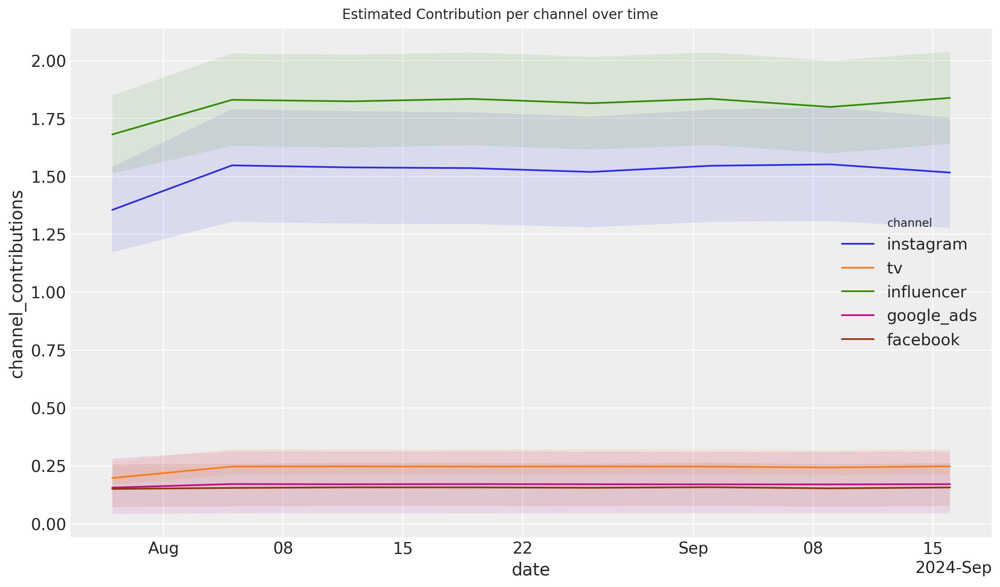

In [129]:
fig = mmm.plot_allocated_contribution_by_channel(samples=response)
fig.suptitle("Estimated Contribution per channel over time");

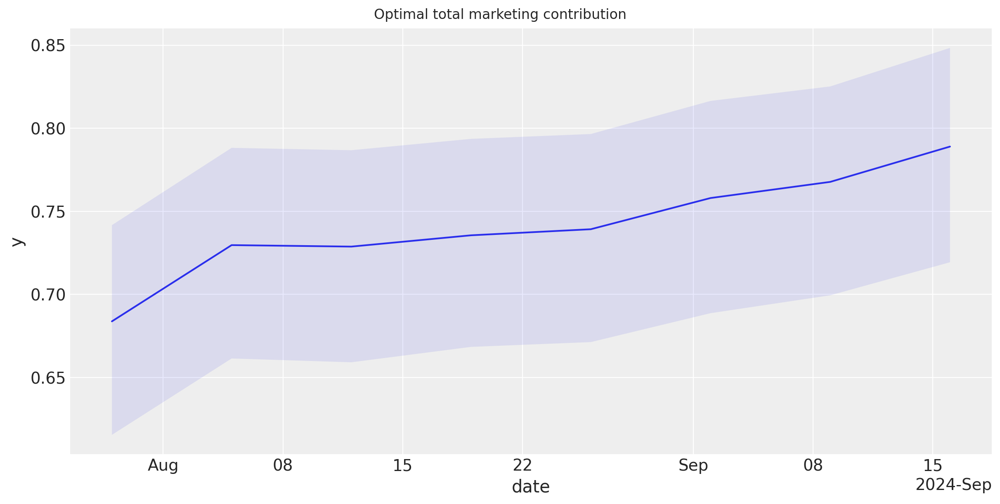

In [130]:
plt.figure(figsize=(12, 6))
plt.suptitle("Optimal total marketing contribution")
response["y"].mean(dim="sample").plot()
plt.fill_between(
    x=response.y.date.values,
    y1=response.y.quantile(0.025, dim="sample"),
    y2=response.y.quantile(0.95, dim="sample"),
    alpha=0.1,
);

In [131]:
last_date = mmm.X["date_week"].max()

# New dates starting from last in dataset
n_new = 8
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

initial_budget_scenario = pd.DataFrame(
    {
        "date_week": new_dates,
    }
)

# Same channel spends as last day
initial_budget_scenario["instagram"] = initial_budget_dict["instagram"]
initial_budget_scenario["tv"] = initial_budget_dict["tv"]
initial_budget_scenario["influencer"] = initial_budget_dict["influencer"]
initial_budget_scenario["google_ads"] = initial_budget_dict["google_ads"]
initial_budget_scenario["facebook"] = initial_budget_dict["facebook"]

# Other features


initial_budget_scenario["t"] = 0

response_initial_budget = mmm.sample_posterior_predictive(
    X_pred=initial_budget_scenario, extend_idata=False
)

response_initial_budget

Output()

<xarray.Dataset> Size: 352kB
Dimensions:  (sample: 4000, date: 8)
Coordinates:
  * date     (date) datetime64[ns] 64B 2024-07-29 2024-08-05 ... 2024-09-16
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 256kB 4.725 4.997 4.362 ... 5.353 5.034
Attributes:
    created_at:                 2024-10-03T17:57:56.123600+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

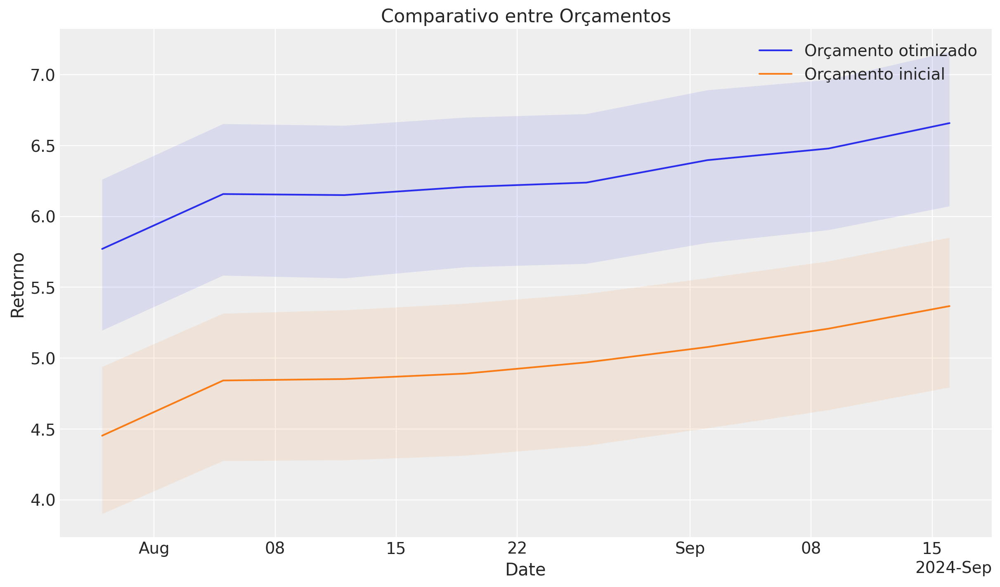

In [136]:
y_response_original_scale_optimize = (
    response["y"] * mmm.get_target_transformer()["scaler"].scale_
)

# Plotting optimized response
y_response_original_scale_optimize.mean(dim="sample").plot(
    label="Orçamento otimizado"
)
plt.fill_between(
    x=y_response_original_scale_optimize.date.values,
    y1=y_response_original_scale_optimize.quantile(0.025, dim="sample"),
    y2=y_response_original_scale_optimize.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Plotting initial budget response
response_initial_budget["y"].mean(dim="sample").plot(
    label="Orçamento inicial"
)
plt.fill_between(
    x=response_initial_budget.y.date.values,
    y1=response_initial_budget.y.quantile(0.025, dim="sample"),
    y2=response_initial_budget.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Adding labels, legend, and title
plt.xlabel("Date")
plt.ylabel("Retorno")
plt.legend()
plt.title("Comparativo entre Orçamentos");

In [133]:
# Initialize two variables to save the results and base conditions for each scenario.
scenarios_result = []
scenarios = np.array([0.6, 0.8, 1.2, 1.8])
for scenario in scenarios:
    tmp_response = mmm.allocate_budget_to_maximize_response(
        budget=total_budget * scenario,
        num_periods=8,
        time_granularity="weekly",
        budget_bounds=budget_bounds,
    )
    scenarios_result.append(tmp_response)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2187: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2187: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2187: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2187: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/di

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808bd687190> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808b7551f30> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808b75524d0> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2309: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7808bccde590> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/l

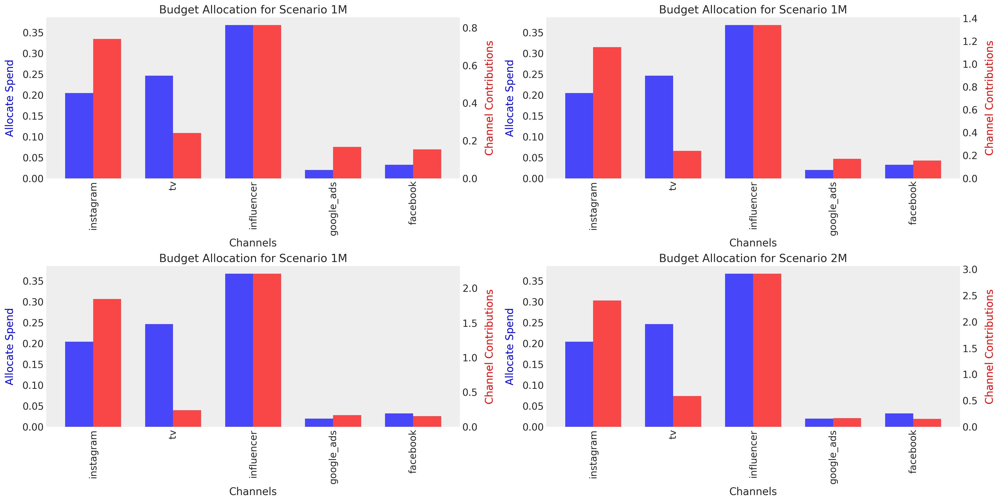

In [134]:
fig_main, ax_main = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
for i, scenario in enumerate(scenarios_result):
    row = i // 2
    col = i % 2
    _, ax = mmm.plot_budget_allocation(samples=scenario, ax=ax_main[row, col])
    ax.set_title(f"Budget Allocation for Scenario {scenarios[i] * total_budget:.0f}M")
plt.tight_layout()
plt.show()